In [1]:
import h5py
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import matplotlib.patches as patches

import os
os.chdir("/Users/deweywang/Desktop/GitHub/HEVisum/")


# Training data preparation 

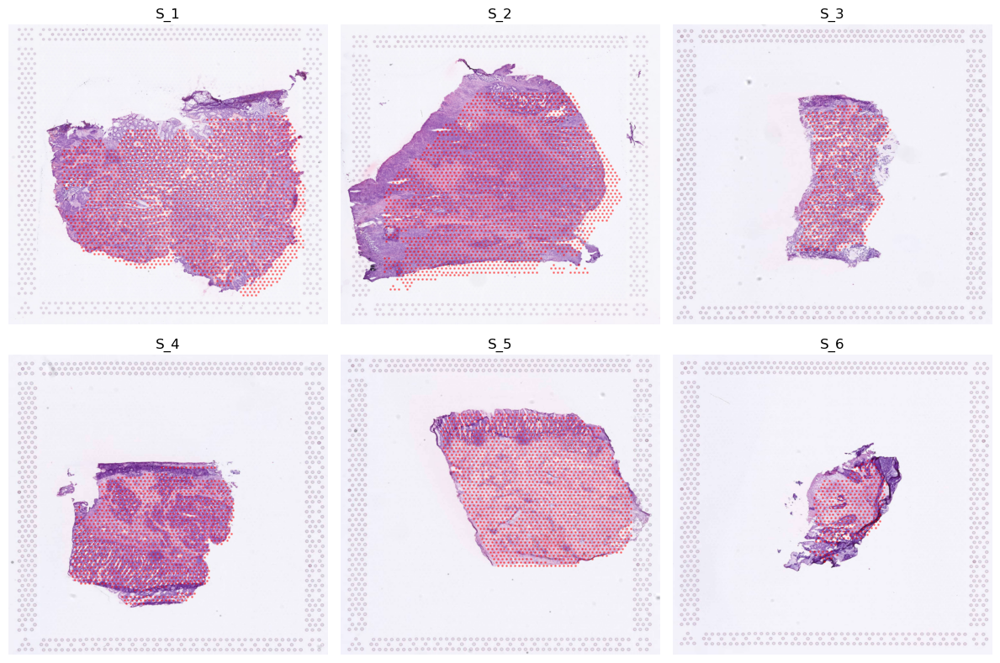

In [2]:
import math
import numpy as np
import h5py
import matplotlib.pyplot as plt

# Open the HDF5 file and load the Train images and spots datasets
with h5py.File("./dataset/elucidata_ai_challenge_data.h5", "r") as h5file:
    train_images = h5file["images/Train"]
    train_spots = h5file["spots/Train"]

    # Get a list of all sample keys (slide identifiers)
    samples = list(train_images.keys())
    n_samples = len(samples)
    
    # Determine grid size (roughly square)
    cols = math.ceil(math.sqrt(n_samples))
    rows = math.ceil(n_samples / cols)
    
    # Create a figure with a grid of subplots
    fig, axs = plt.subplots(rows, cols, figsize=(cols * 4, rows * 4))
    # In case there's only one subplot, make it iterable
    axs = axs.flatten() if n_samples > 1 else [axs]
    
    # Loop through each sample and plot the corresponding data
    for ax, sample in zip(axs, samples):
        image = np.array(train_images[sample])
        spots = np.array(train_spots[sample])
        x, y = spots["x"], spots["y"]

        ax.imshow(image, aspect="auto")
        ax.scatter(x, y, color="red", s=1, alpha=0.4)
        ax.axis('off')
        ax.set_title(sample)
        
    # Hide any unused subplots (if the grid is larger than needed)
    for ax in axs[len(samples):]:
        ax.set_visible(False)
    
    plt.tight_layout()
    plt.show()


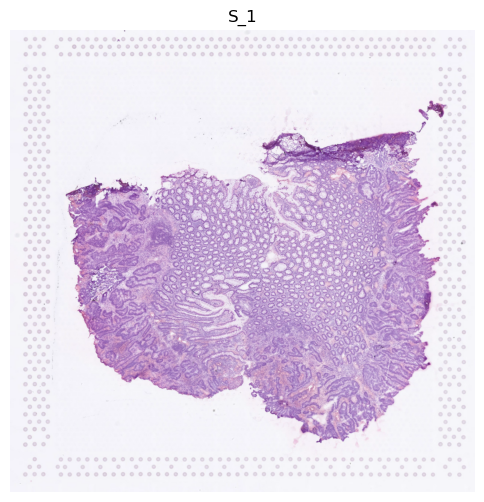

In [6]:
with h5py.File("./dataset/elucidata_ai_challenge_data.h5", "r") as h5file:
    train_images = h5file["images/Train"]
    train_spots = h5file["spots/Train"]
    
    sample = 'S_1'
    image = np.array(train_images[sample])
    spots = np.array(train_spots[sample])
    x, y = spots["x"], spots["y"]
    
    plt.figure(figsize=(6,6))
    plt.imshow(image, aspect="auto")
    #plt.scatter(x, y, color="red", s=1, alpha=0.4)
    plt.axis('off')
    plt.title(sample)
    plt.show()

## Training data augmentation

In [13]:

# Load and display (x,y) spot locations and cell type annotation table for Train slides
with h5py.File("dataset/spots-data/version-5/no_clip_gu_processed_train_spots.h5", "r") as f:
    train_spots = f["spots/log2_Train"]
    
    # Dictionary to store DataFrames for each slide
    train_spot_tables = {}
    
    for slide_name in train_spots.keys():
        # Load dataset as NumPy structured array
        spot_array = np.array(train_spots[slide_name])
        
        # Convert to DataFrame
        df = pd.DataFrame(spot_array)
        
        # Store in dictionary
        train_spot_tables[slide_name] = df
        print(slide_name)

# Example: Display the spots table for slide 'S_1'
train_spot_tables['S_1']

S_1
S_2
S_3
S_4
S_5
S_6


,x,y,zscore_log2_filtered_C1,zscore_log2_filtered_C2,zscore_log2_filtered_C3,zscore_log2_filtered_C4,zscore_log2_filtered_C5,zscore_log2_filtered_C6,zscore_log2_filtered_C7,zscore_log2_filtered_C8,...,zscore_log2_filtered_C26,zscore_log2_filtered_C27,zscore_log2_filtered_C28,zscore_log2_filtered_C29,zscore_log2_filtered_C30,zscore_log2_filtered_C31,zscore_log2_filtered_C32,zscore_log2_filtered_C33,zscore_log2_filtered_C34,zscore_log2_filtered_C35
0,1554,1297,-0.603246,-0.435053,-0.570764,-0.523795,-0.099760,3.204404,-0.510432,0.094953,...,-0.305204,2.848441,1.402928,-0.296408,-0.332695,-0.511507,-0.463607,1.016321,-0.414690,-0.126646
1,462,1502,-0.472097,0.537761,-0.435851,-0.440353,2.367270,-0.435736,0.704734,-0.239895,...,-0.308130,-0.437272,-0.349912,-0.190341,-0.332661,0.804120,0.133164,-0.323027,-0.372806,-0.133392
2,1488,1548,-0.451260,-0.597028,-0.509482,-0.520947,0.435508,-0.426691,-0.606394,-0.269383,...,-0.313622,-0.065456,-0.332085,-0.339042,-0.332745,-0.610033,-0.627723,-0.321262,-0.431268,-0.547821
3,1725,1182,-0.507545,0.783093,-0.465677,-0.498563,3.032796,0.061907,1.986766,-0.084806,...,-0.296417,-0.084218,-0.322369,-0.046703,-0.332668,0.549885,1.008421,-0.326952,-0.408791,0.636778
4,581,1113,-0.457100,-0.369337,-0.452923,-0.431558,1.693930,-0.459043,-0.331140,-0.262851,...,-0.313842,-0.462315,-0.352820,-0.302713,-0.329262,-0.387886,-0.499462,-0.371378,-0.436306,-0.575556
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2144,1055,701,-0.559557,-0.035907,-0.523094,-0.522988,-0.822538,0.859183,-0.051017,-0.025274,...,-0.245349,0.840260,1.853422,0.464063,-0.332718,-0.400502,0.243815,-0.333868,-0.359414,0.773478
2145,1225,862,-0.529086,0.010395,-0.318391,-0.524762,-0.817576,1.381010,-0.164811,-0.196401,...,-0.022436,1.037405,1.027586,0.481288,-0.332743,-0.404575,0.301893,-0.034465,-0.180014,2.424530
2146,765,1479,-0.379121,-0.505304,-0.379173,-0.521146,-0.633435,-0.462212,-0.666774,-0.270042,...,-0.312083,-0.479030,-0.353219,-0.343369,-0.332545,-0.570993,-0.616454,-0.372220,-0.436102,-0.654025
2147,607,1525,-0.618791,0.235444,-0.580484,-0.527196,0.625895,-0.462452,-0.449127,-0.248086,...,-0.301817,-0.468716,-0.331791,0.199688,-0.329564,-0.229333,0.248507,-0.261475,-0.436571,-0.420523


## Smooth spots

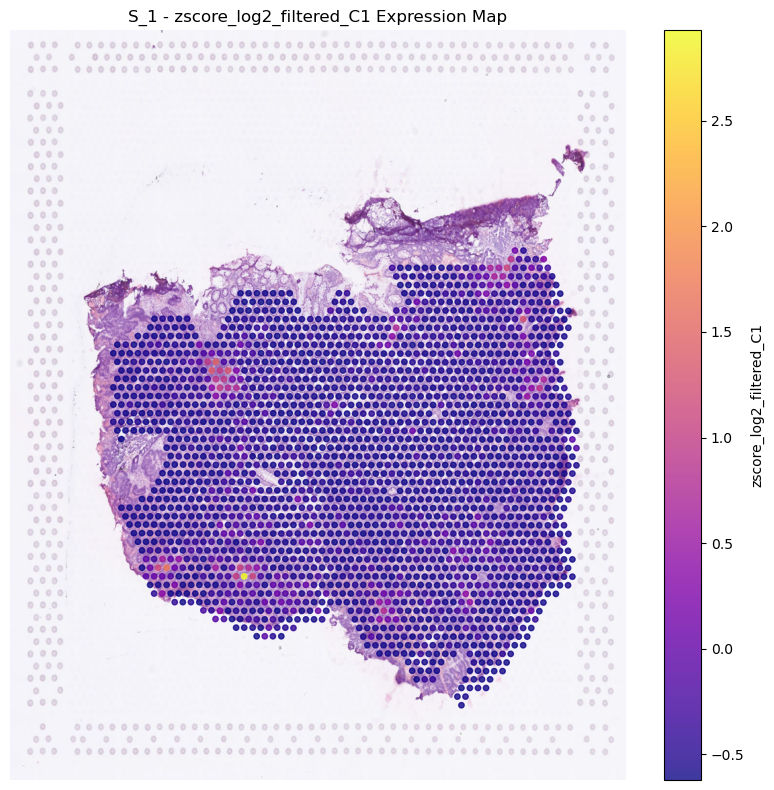

In [2]:
from python_scripts.expression_plot_utils import plot_cell_expression_on_slide
plot_cell_expression_on_slide(
    slide_id = "S_1",
    cell_type = "C1",
    cell_prefix="zscore_log2_filtered_",  # or zscore_boxcox_filtered_
    image_path="./dataset/elucidata_ai_challenge_data.h5",
    spot_path="dataset/spots-data/version-5/no_clip_gu_processed_train_spots.h5",
    group_name="log2_Train"
)

/Users/deweywang/Desktop/GitHub/HEVisum/python_scripts/expression_plot_utils.py:241: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.93, 0.97])


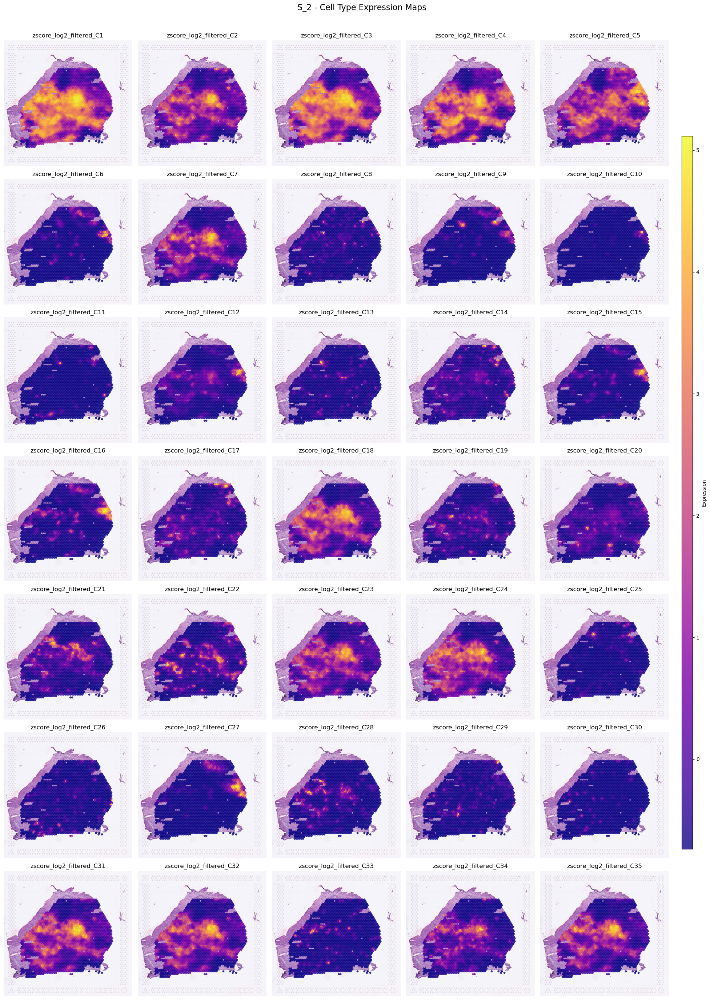

In [42]:
from python_scripts.expression_plot_utils import plot_all_celltypes_on_slide
plot_all_celltypes_on_slide(
    slide_id = "S_2",
    cell_prefix="zscore_log2_filtered_",
    image_path="./dataset/elucidata_ai_challenge_data.h5",
    spot_path_h5="./dataset/spots-data/version-5/gu_smooth_radius30.h5",
    spot_group="log2_Train",
    image_group="Train")



Train S_1
Train S_2
Train S_3
Train S_4
Train S_5
Train S_6


/var/folders/7g/j5s0yzcj34l3v043s7znkplc0000gn/T/ipykernel_89799/1039634866.py:141: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.93, 1])
/var/folders/7g/j5s0yzcj34l3v043s7znkplc0000gn/T/ipykernel_89799/1039634866.py:141: UserWarning: Glyph 128300 (\N{MICROSCOPE}) missing from font(s) DejaVu Sans.
  plt.tight_layout(rect=[0, 0, 0.93, 1])


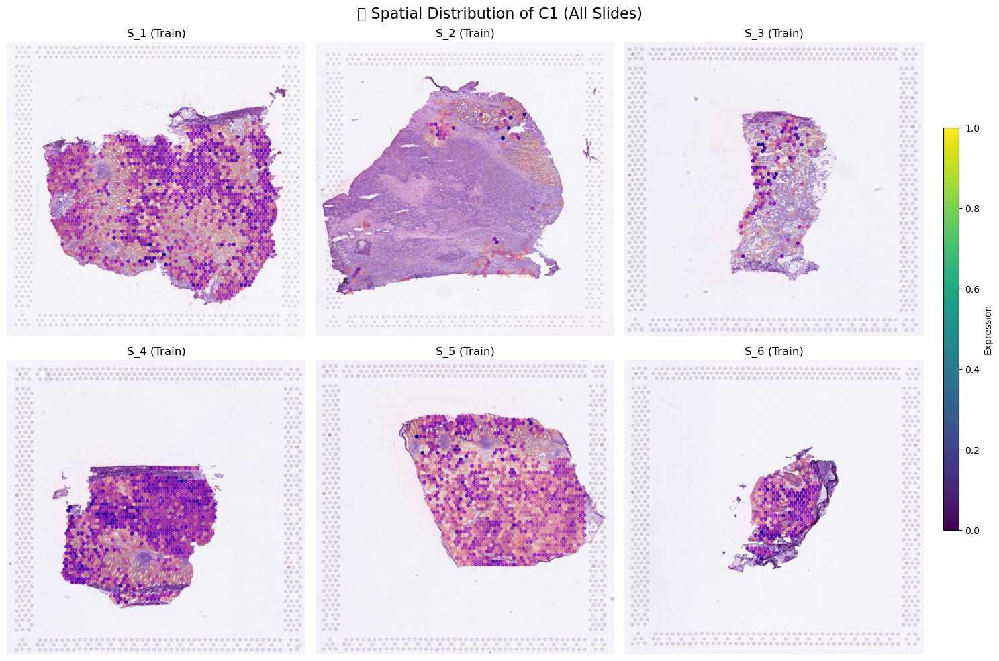

In [15]:
plot_cell_expression_all_slides(
    cell_short_name='C1',
    cell_prefix='rank_',
    image_path="./dataset/elucidata_ai_challenge_data.h5",
    spot_path="dataset/realign/spot-rank/version-1/directly_rank_train_spots.h5",
    group_name="Train"
)

# gu_smooth_processed_train_spots_log2 , log2_filtered_
# gu_smooth_processed_train_spots , zscore_log2_filtered_

In [12]:

def plot_cell_expression_all_slides(
    cell_short_name='C17',
    cell_prefix='zscore_log2_filtered_',
    image_path="./dataset/elucidata_ai_challenge_data.h5",
    spot_path="dataset/spots-data/version-4/gu_zscore_processed_train_spots.h5",  # 用於 Train 組的 spots與表達量
    group_name="log2_Train",                          # 用於 Train 組，Test 依然用相同欄位名稱（但 Test 的 CSV 只有 "C*"）
    dataset_type="Train",                             # 如果不輸入 submission_spot_data，僅顯示此組
    submission_spot_data=None                         # 如果有，則同時顯示 Train 與 Test
):
    import matplotlib.pyplot as plt
    import numpy as np
    import h5py
    import pandas as pd
    import math
    import os

    # 為 Train 組，建立 full_col_name；而對於 Test 組的 submission 資料則直接用 cell_short_name
    full_col_name = cell_prefix + cell_short_name

    # 如果 submission_spot_data 有值，則要顯示 Train 與 Test 兩組；否則只顯示指定的 dataset_type
    if submission_spot_data is not None:
        groups_to_plot = ["Train", "Test"]
    else:
        groups_to_plot = [dataset_type]

    results = []  # 儲存每個 slide 的資料

    for grp in groups_to_plot:
        # 讀取該組所有 slide id（從圖像部分）
        with h5py.File(image_path, "r") as img_h5:
            slide_ids = list(img_h5[f"images/{grp}"].keys())
        for slide in slide_ids:
            # ---------- 讀取圖像 ----------
            with h5py.File(image_path, "r") as h5file:
                img = np.array(h5file[f"images/{grp}"][slide])
            # ---------- 讀取 spots 座標 ----------
            # Train 組從 HDF5 的 spot_path 讀取；Test 組則從 image_path 同一檔案讀取
            if grp == "Train":
                with h5py.File(spot_path, "r") as sp_h5:
                    print(grp, slide)
                    spots = np.array(sp_h5[f"spots/{group_name}"][slide])
                    x = spots["x"]
                    y = spots["y"]
            else:
                with h5py.File(image_path, "r") as h5file:
                    spots = np.array(h5file[f"spots/{grp}"][slide])
                    x = spots["x"]
                    y = spots["y"]

            # ---------- 讀取表達量資料 ----------
            if grp == "Train":
                # Train 組：從 HDF5 讀取 spot 資料
                with h5py.File(spot_path, "r") as sp_h5:
                    df = pd.DataFrame(np.array(sp_h5[f"spots/{group_name}"][slide]))
                # 對 Train 組採用 full_col_name
                target_col = full_col_name
            else:
                # Test 組：如果有 submission_spot_data，就用它
                if submission_spot_data is not None:
                    if isinstance(submission_spot_data, str) and os.path.isfile(submission_spot_data):
                        df_test = pd.read_csv(submission_spot_data)
                        # 如果有 slide_id 欄位就過濾
                        if "slide_id" in df_test.columns:
                            df = df_test[df_test["slide_id"] == slide]
                        else:
                            df = df_test.copy()
                    elif isinstance(submission_spot_data, pd.DataFrame):
                        df_test = submission_spot_data.copy()
                        if "slide_id" in df_test.columns:
                            df = df_test[df_test["slide_id"] == slide]
                        else:
                            df = df_test.copy()
                    else:
                        raise ValueError("submission_spot_data 必須為 CSV 路徑或 pandas DataFrame。")
                    # 對於 Test 的 submission 資料，欄位名稱固定為 cell_short_name（如 "C17"）
                    target_col = cell_short_name
                else:
                    # Test 組但沒有 submission_spot_data，則從 HDF5 讀取
                    with h5py.File(spot_path, "r") as sp_h5:
                        df = pd.DataFrame(np.array(sp_h5[f"spots/{group_name}"][slide]))
                    target_col = full_col_name

            # ---------- 驗證表達量資料行數與座標數是否一致 ----------
            if df.shape[0] != len(x):
                print(f"⚠️ In slide {slide} ({grp}): 資料行數 {df.shape[0]} 與座標數 {len(x)} 不一致，跳過")
                continue

            results.append({
                "group": grp,
                "slide": slide,
                "image": img,
                "df": df,
                "x": x,
                "y": y,
                "target_col": target_col
            })

    if len(results) == 0:
        raise ValueError("沒有符合條件的 slide 進行繪圖。")

    # ---------- 建立整體子圖畫布 ----------
    n = len(results)
    cols = 3
    rows = math.ceil(n / cols)
    fig, axes = plt.subplots(rows, cols, figsize=(5*cols,5*rows))
    axes = axes.flatten()
    used = 0

    for res in results:
        ax = axes[used]; used += 1
        img = res["image"]; df = res["df"]
        x, y = res["x"], res["y"]; col = res["target_col"]
        expr = df[col].values.astype(float)

        # ---- 关键部分：根据 expr 动态算 alpha ----
        # 1) 归一化到 [0,1]
        if expr.max() > expr.min():
            expr_norm = (expr - expr.min()) / (expr.max() - expr.min())
        else:
            expr_norm = np.zeros_like(expr)
        # 2) alpha = 1 - expr_norm*0.9 -> [1, 0.1]
        alphas = 1.0 - expr_norm * 1

        # 3) 用 colormap 拿到 RGBA，并替换 alpha 通道
        cmap = plt.get_cmap("plasma")
        norm  = plt.Normalize(expr.min(), expr.max())
        colors = cmap(norm(expr))
        colors[:, 3] = alphas  # 覆盖透明度

        # ---- 绘图 ----
        ax.imshow(img, aspect="auto")
        sc = ax.scatter(x, y, color=colors, s=10)
        ax.set_title(f"{res['slide']} ({res['group']})")
        ax.axis("off")

    
    fig.subplots_adjust(right=0.92)
    cbar_ax = fig.add_axes([0.94, 0.2, 0.015, 0.6])
    fig.colorbar(sc, cax=cbar_ax, label='Expression')
    plt.suptitle(f"🔬 Spatial Distribution of {cell_short_name} (All Slides)", fontsize=16)
    plt.tight_layout(rect=[0, 0, 0.93, 1])
    plt.show()

Train S_1
Train S_2
Train S_3
Train S_4
Train S_5
Train S_6


/var/folders/7g/j5s0yzcj34l3v043s7znkplc0000gn/T/ipykernel_89799/1039634866.py:141: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.93, 1])
/var/folders/7g/j5s0yzcj34l3v043s7znkplc0000gn/T/ipykernel_89799/1039634866.py:141: UserWarning: Glyph 128300 (\N{MICROSCOPE}) missing from font(s) DejaVu Sans.
  plt.tight_layout(rect=[0, 0, 0.93, 1])


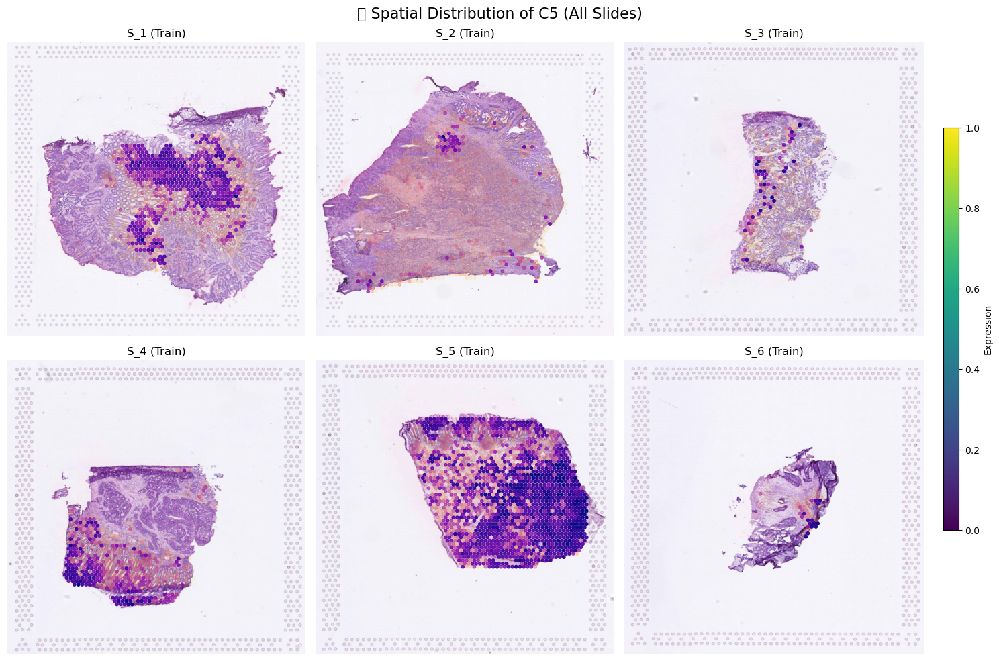

In [20]:
plot_cell_expression_all_slides(
    cell_short_name='C5',
    cell_prefix='rank_',
    image_path="./dataset/elucidata_ai_challenge_data.h5",
    spot_path="dataset/spot-rank/version-1/directly_rank_train_spots_v2.h5",
    group_name="Train"
)

# gu_smooth_processed_train_spots_log2 , log2_filtered_
# gu_smooth_processed_train_spots , zscore_log2_filtered_

In [34]:
import h5py
import numpy as np
from python_scripts.spatial_smooth import smooth_all_slides_and_save

# 先載入原本的資料（跟你之前一樣）
with h5py.File("./dataset/spot-rank/version-1/directly_rank_train_spots.h5", "r") as f:
    train_spots = f["spots/Train"]
    train_spot_tables = {
        slide: pd.DataFrame(np.array(train_spots[slide]))
        for slide in train_spots.keys()
    }

# 找出所有 cell type 欄位（z-score 後的）
cell_type_cols = [col for col in train_spot_tables["S_1"].columns if col.startswith("rank_")]

# 設定儲存路徑
save_folder = "./dataset/spot-rank/version-2/"
if not os.path.exists(save_folder):
    os.makedirs(save_folder)
    
smoothed_path = os.path.join(save_folder, "gu_rank_radius30.h5")


smooth_all_slides_and_save(train_spot_tables, cell_type_cols, smoothed_path, radius=30)


Processing slides: 100%|██████████| 6/6 [00:02<00:00,  2.05it/s]

✅ 所有 slide 都已平滑並存成 ./dataset/spot-rank/version-2/gu_rank_radius30.h5，格式與 processed_train_spots.h5 相同！
